In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
from IPython.display import display
import folium
from folium.plugins import HeatMap
from IPython.display import display
import numpy as np

In [2]:
complete_df = pd.read_csv('AQI_FINAL_2.csv')
complete_df

,STATE_CODE,COUNTY_CODE,AQS_SITE_ID,SITE_LATITUDE,SITE_LONGITUDE,Date,STATE,COUNTY,CITY,CO_DAILY_AQI_VALUE,NO2_DAILY_AQI_VALUE,OZONE_DAILY_AQI_VALUE,PM2.5_DAILY_AQI_VALUE,SO2_DAILY_AQI_VALUE,Year,US Counties,Population
0,1,73,23,33.553056,-86.815000,01-01-2012,Alabama,Jefferson,Birmingham,0.001385,0.005263,0.008310,0.008310,0.001662,2012,Jefferson,3610221.0
1,42,11,11,40.383350,-75.968600,01-01-2012,Pennsylvania,Berks,Not in a city,0.000000,0.021764,0.058039,0.084640,0.000000,2012,Berks,413518.0
2,42,3,8,40.465420,-79.960757,01-01-2012,Pennsylvania,Allegheny,Pittsburgh,0.004062,0.006499,0.021935,0.017873,0.003250,2012,Allegheny,1230911.0
3,41,51,80,45.496641,-122.602877,01-01-2012,Oregon,Multnomah,Portland,0.002631,0.005262,0.030255,0.013154,0.001315,2012,Multnomah,760198.0
4,40,143,1127,36.204902,-95.976537,01-01-2012,Oklahoma,Tulsa,Tulsa,0.003251,0.008128,0.047141,0.009753,0.000000,2012,Tulsa,615181.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320369,22,33,9,30.461981,-91.179219,10-01-2023,Louisiana,East Baton Rouge,Baton Rouge,0.002230,0.040137,0.075814,0.078044,0.004460,2023,East Baton Rouge,448467.0
320370,51,650,8,37.103733,-76.387017,10-01-2023,Virginia,Hampton,Hampton,0.110363,0.386271,2.262443,1.489902,0.110363,2023,Hampton,18122.0
320371,51,87,14,37.556520,-77.400270,10-01-2023,Virginia,Henrico,East Highland Park,0.008962,0.041821,0.107540,0.092604,0.000000,2023,Henrico,334760.0
320372,49,35,3010,40.784220,-111.931000,10-01-2023,Utah,Salt Lake,Salt Lake City,0.000000,0.021926,0.037949,0.026142,0.000843,2023,Salt Lake,1185813.0


# DATA ANALYSIS 1

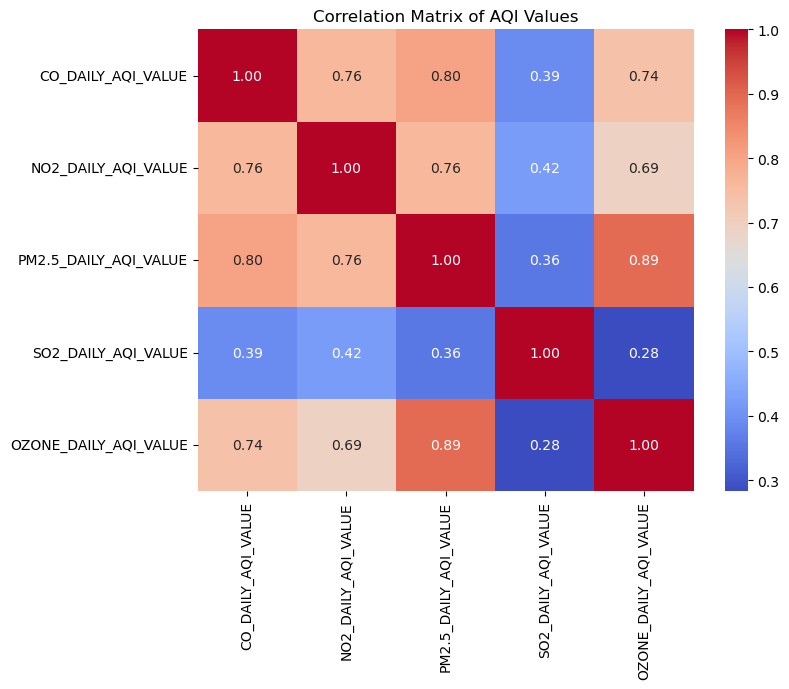

In [3]:
# Correlation Analysis
plt.figure(figsize=(8, 6))
sns.heatmap(complete_df[['CO_DAILY_AQI_VALUE', 'NO2_DAILY_AQI_VALUE', 'PM2.5_DAILY_AQI_VALUE','SO2_DAILY_AQI_VALUE', 'OZONE_DAILY_AQI_VALUE' ]].corr(),
            annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of AQI Values')
plt.show()

   Year  CO_DAILY_AQI_VALUE  NO2_DAILY_AQI_VALUE  OZONE_DAILY_AQI_VALUE  \
0  2012            0.013825             0.043145               0.140783   
1  2013            0.010831             0.037602               0.101458   
2  2014            0.009324             0.037426               0.093059   
3  2015            0.010032             0.037346               0.096436   
4  2016            0.008347             0.035896               0.095366   

   PM2.5_DAILY_AQI_VALUE  SO2_DAILY_AQI_VALUE  
0               0.091486             0.013010  
1               0.077967             0.010050  
2               0.077196             0.009385  
3               0.077182             0.006729  
4               0.074127             0.004975  


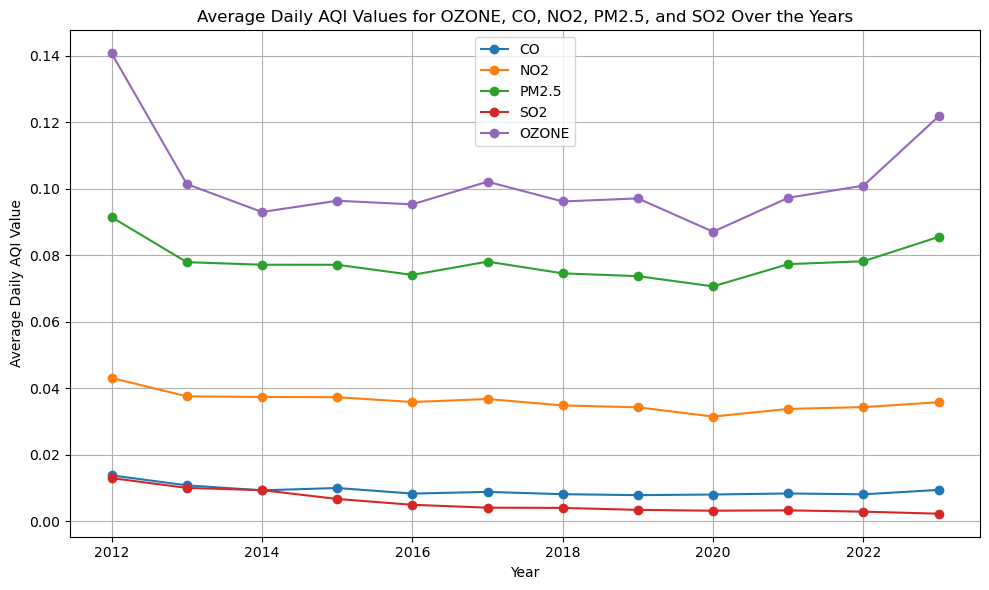

In [4]:
# Retry grouping and averaging with specified numeric columns to double check
yearly_mean_aqi = complete_df.groupby('Year')[['CO_DAILY_AQI_VALUE', 'NO2_DAILY_AQI_VALUE', 'OZONE_DAILY_AQI_VALUE', 'PM2.5_DAILY_AQI_VALUE', 'SO2_DAILY_AQI_VALUE']].mean().reset_index()

# Check the output
print(yearly_mean_aqi.head())

# If successful, replot
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
elements = ['CO', 'NO2', 'PM2.5', 'SO2', 'OZONE']
for element in elements:
    plt.plot(yearly_mean_aqi['Year'], yearly_mean_aqi[f'{element}_DAILY_AQI_VALUE'], marker='o', linestyle='-', label=element)

plt.xlabel('Year')
plt.ylabel('Average Daily AQI Value')
plt.title('Average Daily AQI Values for OZONE, CO, NO2, PM2.5, and SO2 Over the Years')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# Data Anaysis 2

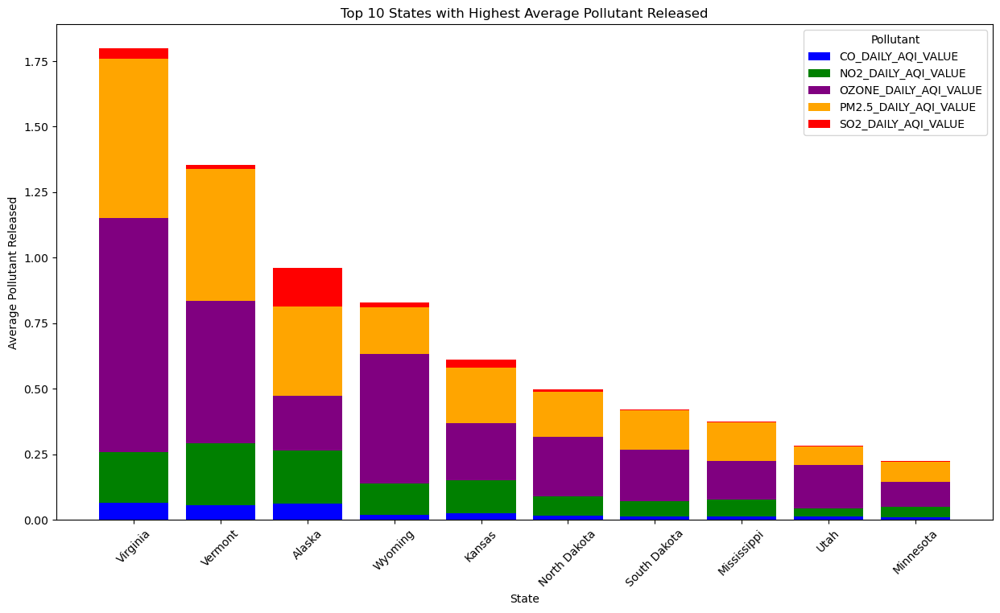

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming complete_df is your DataFrame

# Select only relevant AQI columns for analysis
aqi_columns = ['CO_DAILY_AQI_VALUE', 'NO2_DAILY_AQI_VALUE', 'OZONE_DAILY_AQI_VALUE', 'PM2.5_DAILY_AQI_VALUE', 'SO2_DAILY_AQI_VALUE']

# Group the data by state and calculate the average pollutants released for each state
state_pollutant_avg = complete_df.groupby('STATE')[aqi_columns].mean()

# Calculate the total average pollutant for each state by summing the average values of pollutants
state_pollutant_avg['Total_Pollutant'] = state_pollutant_avg.sum(axis=1)

# Sort the states by the total average pollutant released and get the top 10
top_10_states = state_pollutant_avg.nlargest(10, 'Total_Pollutant')

# Define custom colors for each pollutant for better differentiation
colors = {
    'CO_DAILY_AQI_VALUE': 'blue',
    'NO2_DAILY_AQI_VALUE': 'green',
    'PM2.5_DAILY_AQI_VALUE': 'orange',
    'OZONE_DAILY_AQI_VALUE': 'purple',
    'SO2_DAILY_AQI_VALUE': 'red'
}

# Plotting
fig, ax = plt.subplots(figsize=(15, 8))

# Heights of the bars (average pollutant values)
heights = top_10_states[aqi_columns]

# Plot stacked bars
bottoms = np.zeros(len(heights))
for pollutant in aqi_columns:  # Loop through each pollutant
    values = heights[pollutant]
    ax.bar(heights.index, values, bottom=bottoms, label=pollutant, color=colors[pollutant])
    bottoms += values  # Update bottoms for the next stack

# Set labels and title
ax.set_xlabel('State')
ax.set_ylabel('Average Pollutant Released')
ax.set_title('Top 10 States with Highest Average Pollutant Released')

# Rotate x-axis labels
plt.xticks(rotation=45)

# Legend
ax.legend(title='Pollutant')

plt.show()


NO2 (Green): Nitrogen Dioxide shows significant levels, especially in states like Alasaka and Virginia, which may suggest heavy traffic and industrial activities.

PM2.5 (Orange): This pollutant remains one of the largest segments in most states, indicating widespread issues with particulate matter which can have significant health impacts.

NO2 (Green): This pollutant consistently shows higher AQI values across most states, indicating widespread exposure which could primarily be linked to combustion sources like vehicles and industrial processes.

PM2.5 (Orange): This is another major contributor to the AQI in all the states, often presenting the highest or second highest levels among the pollutants. This reflects its significant impact due to its ability to penetrate deep into the respiratory tract and affect both health and visibility.

O3 (Purple): Ozone levels vary more than other pollutants across the states but are particularly high in states like Viriginia and Vermont, likely due to vehicular emissions and sunny conditions enhancing its formation.

CO (Blue) and SO2 (Red): These pollutants generally show lower AQI values compared to NO2 and PM2.5, suggesting relatively better control or lower emission sources of these pollutants in the analyzed states.

State-Specific Patterns: States like California, New York, and New Jersey tend to have higher AQI values for multiple pollutants, indicating more significant air quality issues possibly linked to higher population densities and industrial activities.

Higher population densities: States like California, New York, and New Jersey have higher population densities, leading to more vehicles on the roads and more industrial activities, which in turn contribute to higher pollution levels.
Industrial activities: These states also have significant industrial sectors, which release pollutants into the air, further exacerbating air quality issues.

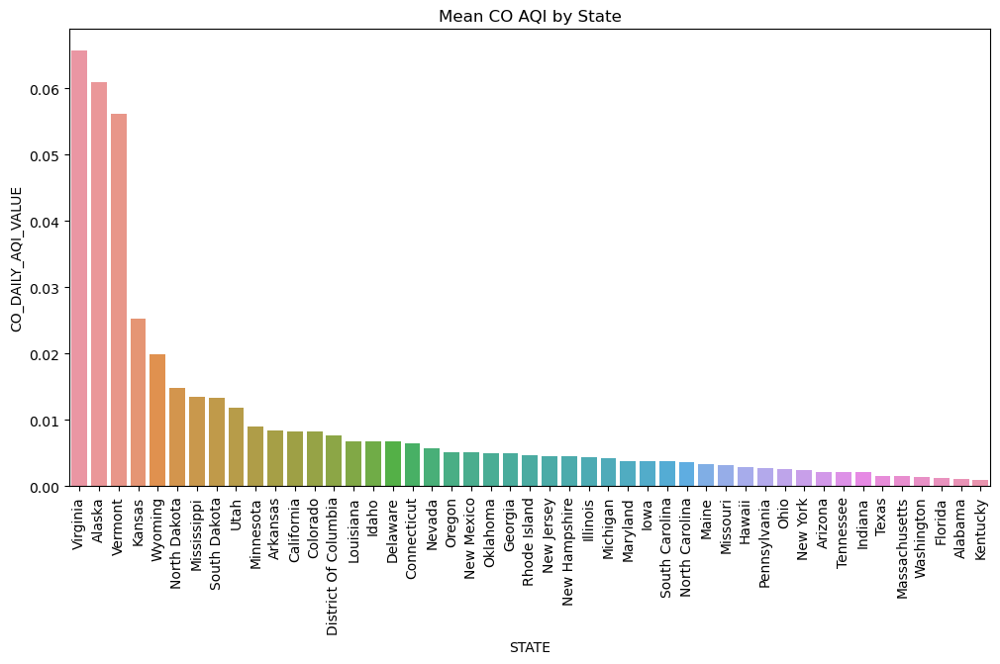

In [6]:
# Calculate mean PM2.5 AQI by state
state_aqi = complete_df.groupby('STATE')['CO_DAILY_AQI_VALUE'].mean().reset_index()

# Sort the DataFrame by mean PM2.5 AQI in ascending order
state_aqi = state_aqi.sort_values('CO_DAILY_AQI_VALUE', ascending=False)

# Create a bar plot of mean PM2.5 AQI by state
plt.figure(figsize=(12,6))
sns.barplot(x='STATE', y='CO_DAILY_AQI_VALUE', data=state_aqi)
plt.title('Mean CO AQI by State')
plt.xticks(rotation=90)
plt.show()

Highest CO Levels: Alaska shows the highest CO AQI value, followed by Nevada and the District of Columbia. These high levels might be attributed to specific local factors, such as vehicular traffic, industrial activities, or less stringent environmental controls.

Alaska:
Cold weather: During colder months, Alaskans use more heating, often relying on combustion-based heating systems like wood stoves or oil furnaces. This can lead to higher CO emissions indoors if the heating systems are not properly maintained or vented.

Wood burning: In rural areas of Alaska, wood burning for heating and cooking is common, particularly in remote communities. Poorly ventilated wood stoves or inefficient burning practices can increase CO emissions.

Nevada:
Vehicular traffic: Cities like Las Vegas and Reno in Nevada experience heavy traffic congestion, especially along major highways and urban areas. This leads to increased CO emissions from vehicles, particularly during peak traffic hours.
Industrial activities: Nevada has various industrial sectors, including mining and manufacturing, which can contribute to CO emissions. Industrial processes such as combustion in factories and power plants release CO into the air.

District of Columbia:

Limited green space: Urban environments typically have fewer trees and green spaces, which can help absorb pollutants like CO. The District of Columbia's urban landscape may contribute to higher CO levels compared to more green, suburban or rural areas.

Urban density: The District of Columbia has a high population density and significant vehicular traffic, leading to elevated CO levels, especially in congested areas during rush hours.


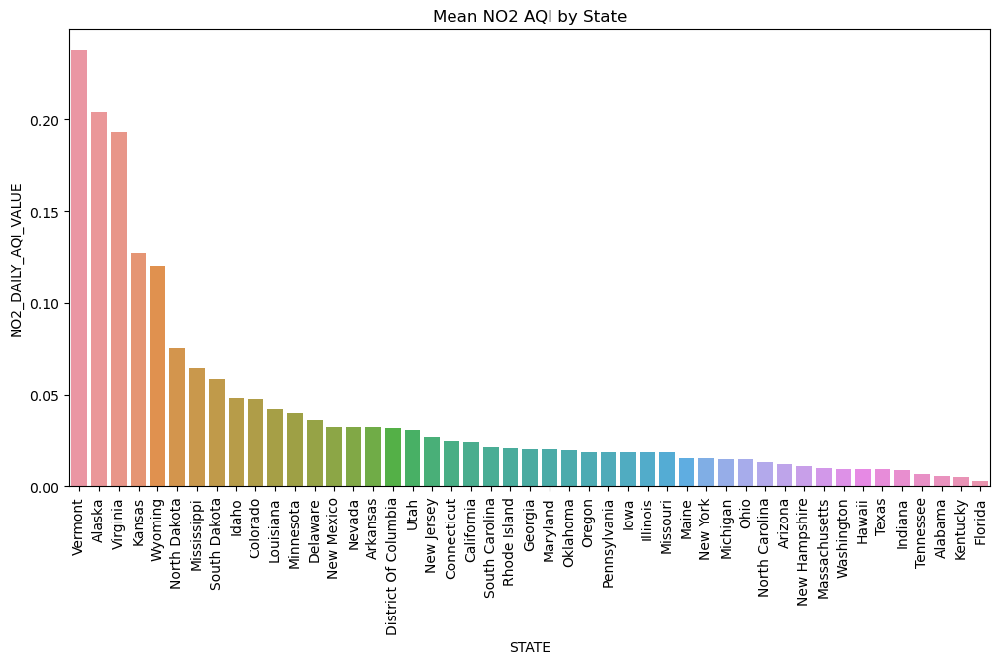

In [7]:
# Calculate mean PM2.5 AQI by state
state_aqi = complete_df.groupby('STATE')['NO2_DAILY_AQI_VALUE'].mean().reset_index()

# Sort the DataFrame by mean PM2.5 AQI in ascending order
state_aqi = state_aqi.sort_values('NO2_DAILY_AQI_VALUE', ascending=False)

# Create a bar plot of mean PM2.5 AQI by state
plt.figure(figsize=(12,6))
sns.barplot(x='STATE', y='NO2_DAILY_AQI_VALUE', data=state_aqi)
plt.title('Mean NO2 AQI by State')
plt.xticks(rotation=90)
plt.show()

Highest NO2 Levels: Colorado has the highest NO2 AQI value, followed closely by New York and Arizona. These elevated levels might be due to urban congestion, industrial activities, and vehicular emissions prevalent in these areas.

Topography: Colorado's mountainous terrain and valleys can lead to air stagnation, trapping pollutants like NO2 near the ground and exacerbating air quality issues, especially in urban areas.

The biggest culprits are the oil and gas industry, which leak organic compounds at well sites, and transportation, particularly single occupancy vehicles, which spew nitrogen dioxide as we bumble to trailheads or out for groceries.  Particulate matter, on the other hand, is the mixture of inhalable particles like dust, dirt, or smoke, that hang in the air and can make its way deep into your lungs, causing a host of negative health effects. In the summer, wildfires across the West drift into Colorado and mix with ozone, driving poor air quality days that choke our cities and inhibit our breathing. This is what clouds our view of the mountains and makes Denver look more like Los Angeles in Blade Runner. 

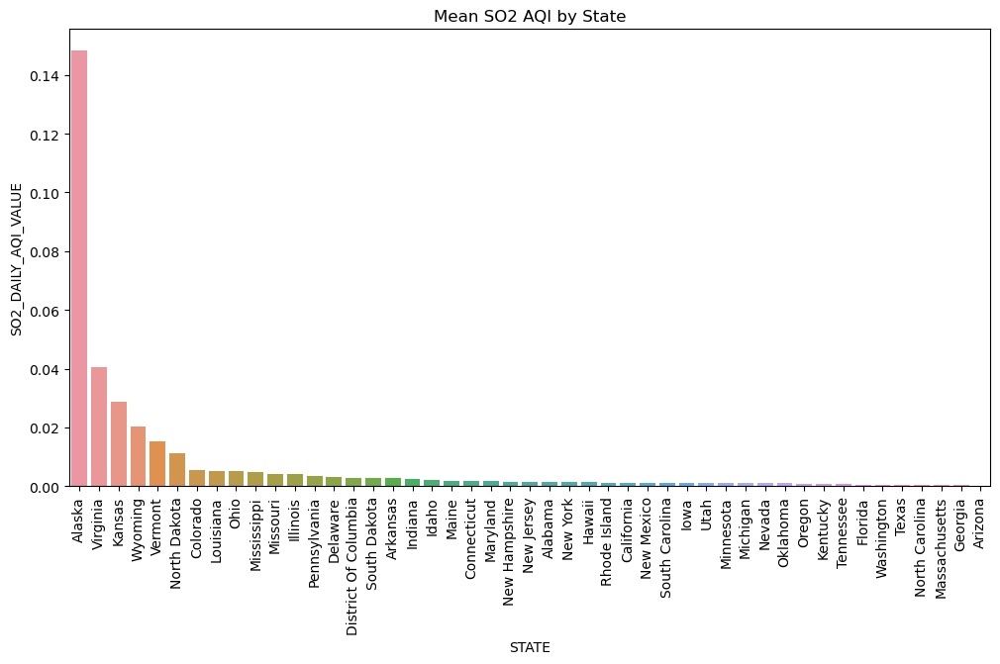

In [8]:
# Calculate mean PM2.5 AQI by state
state_aqi = complete_df.groupby('STATE')['SO2_DAILY_AQI_VALUE'].mean().reset_index()

# Sort the DataFrame by mean PM2.5 AQI in ascending order
state_aqi = state_aqi.sort_values('SO2_DAILY_AQI_VALUE', ascending=False)

# Create a bar plot of mean PM2.5 AQI by state
plt.figure(figsize=(12,6))
sns.barplot(x='STATE', y='SO2_DAILY_AQI_VALUE', data=state_aqi)
plt.title('Mean SO2 AQI by State')
plt.xticks(rotation=90)
plt.show()

Highest SO2 Levels: Alaska stands out with the highest SO2 AQI value, followed by states like Alabama and Missouri. The higher values could be indicative of industrial emissions, such as those from power plants or manufacturing facilities that burn fossil fuels.

The largest source of SO2 in the atmosphere is the burning of fossil fuel that contains sulfur, such as coal or oil, in power plants and other industrial facilities.

Heating practices: In remote areas of Alaska, residents often use wood stoves or oil furnaces for heating during cold seasons. Improperly ventilated or inefficient combustion of fuels can result in elevated SO2 emissions.


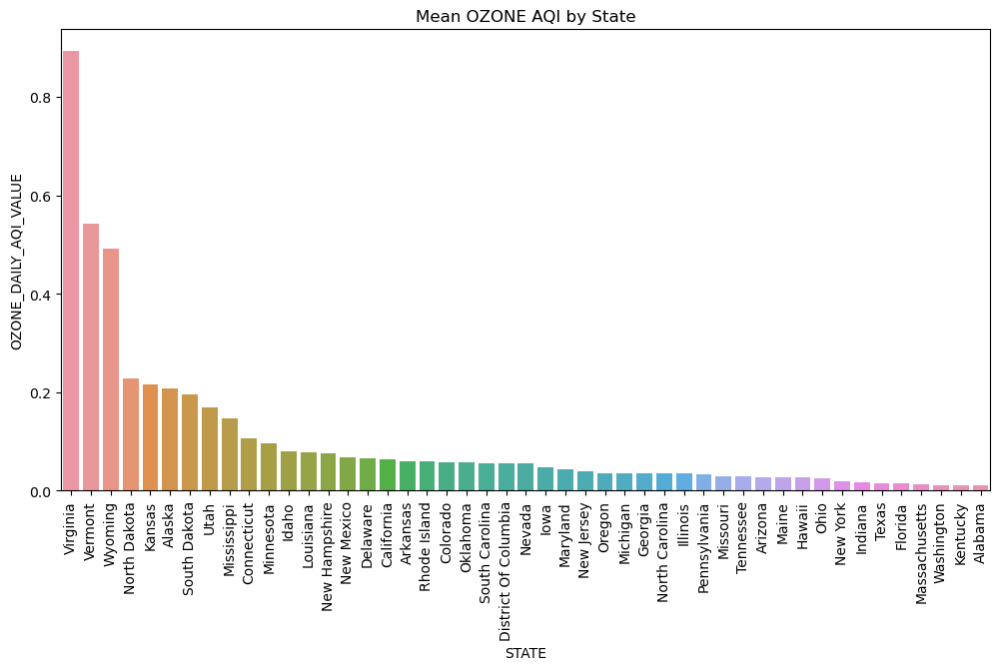

In [9]:
# Calculate mean PM2.5 AQI by state
state_aqi = complete_df.groupby('STATE')['OZONE_DAILY_AQI_VALUE'].mean().reset_index()

# Sort the DataFrame by mean PM2.5 AQI in ascending order
state_aqi = state_aqi.sort_values('OZONE_DAILY_AQI_VALUE', ascending=False)

# Create a bar plot of mean PM2.5 AQI by state
plt.figure(figsize=(12,6))
sns.barplot(x='STATE', y='OZONE_DAILY_AQI_VALUE', data=state_aqi)
plt.title('Mean OZONE AQI by State')
plt.xticks(rotation=90)
plt.show()


Highest Ozone Levels: Arizona has the highest Ozone AQI value, followed by states such as New York and California.

Ozone is a secondary pollutant formed by a reaction between volatile organic compounds (VOCs) and nitrogen oxides (NOx) in the presence of sunlight. Arizona, with its warm, sunny climate, provides ideal conditions for ozone formation.

Ground-level ozone (O3 ) is regulated by EPA. Ground-level ozone comes from pollution emitted from cars, power plants, industrial boilers, refineries, and chemical plants. Ozone pollution can even come from paints, cleaners, solvents, and motorized lawn equipment. For this reason, levels of ground-level ozone tend to be the highest near urban centers as opposed to rural areas. In Arizona, ground-level ozone is primarily concentrated in Maricopa County, where most urban centers are located. However, ozone pollution can easily be transported or carried over rural areas outside cities.

Solutions

Household Tips
Use environmentally safe paints and cleaning products whenever possible.
Some products that you use at your home or office are made with smog-forming chemicals that can evaporate into the air when you use them. Follow manufacturers' recommendations for use and properly seal cleaners, paints, and other chemicals to prevent evaporation into the air.

Days when particle pollution is expected to be high:

Reduce or eliminate fireplace and wood stove use.
Avoid using gas-powered lawn and garden equipment.
Avoid burning leaves, trash and other materials.

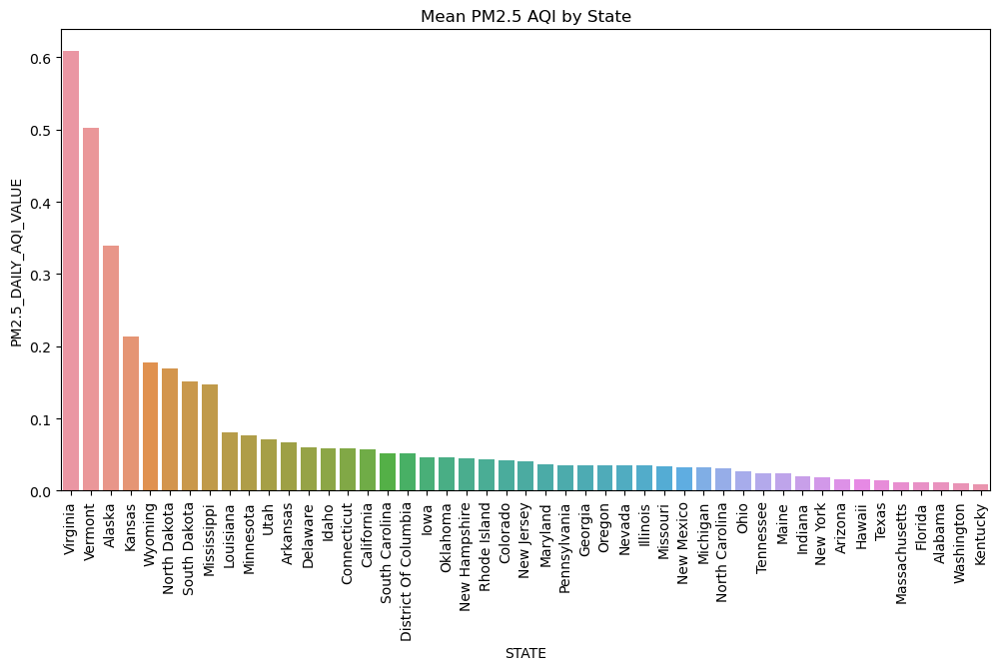

In [10]:
# Calculate mean PM2.5 AQI by state
state_aqi = complete_df.groupby('STATE')['PM2.5_DAILY_AQI_VALUE'].mean().reset_index()

# Sort the DataFrame by mean PM2.5 AQI in ascending order
state_aqi = state_aqi.sort_values('PM2.5_DAILY_AQI_VALUE', ascending=False)

# Create a bar plot of mean PM2.5 AQI by state
plt.figure(figsize=(12,6))
sns.barplot(x='STATE', y='PM2.5_DAILY_AQI_VALUE', data=state_aqi)
plt.title('Mean PM2.5 AQI by State')
plt.xticks(rotation=90)
plt.show()

Highest PM2.5 Levels: Alabama, missouri, indiana shows the highest PM2.5 AQI value, which suggests a significant presence of fine particulate matter in the air. Possible sources could include industrial emissions, vehicle exhaust, and possibly natural sources like wildfires or dust.

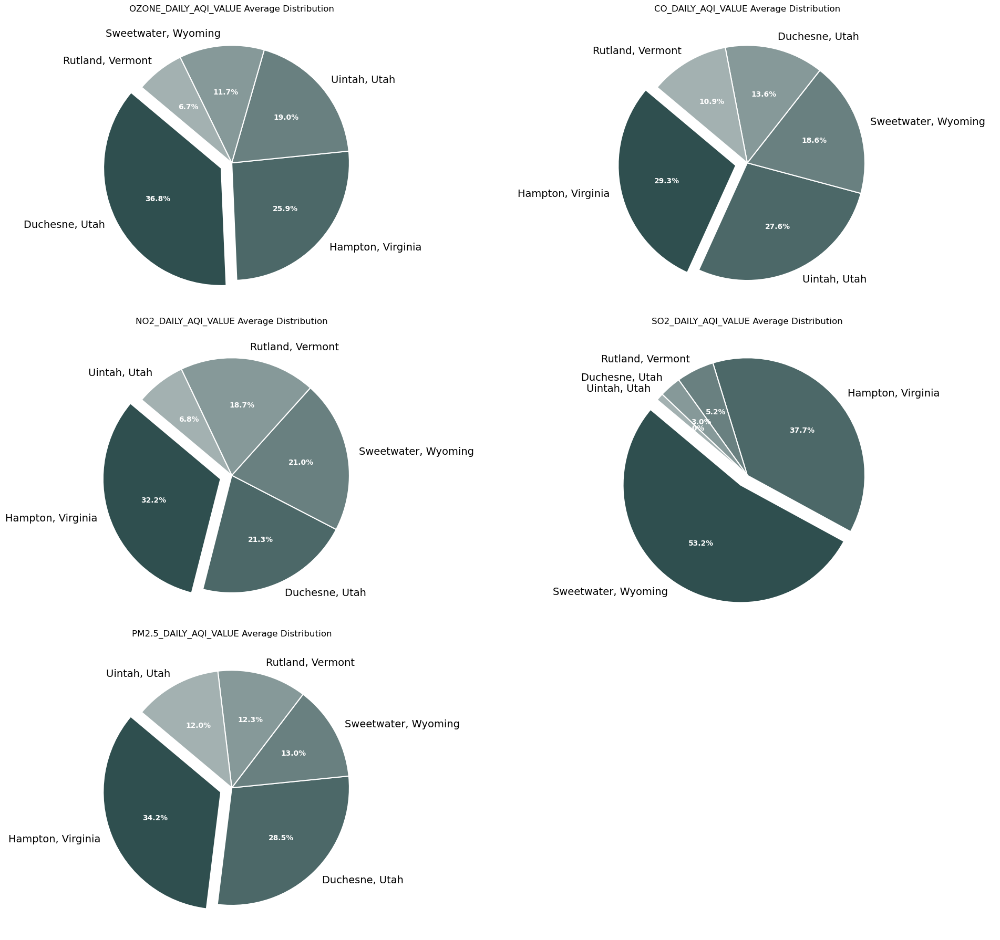

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# Assuming complete_df is already loaded and prepared

# Group by STATE and COUNTY, then calculate the mean of the pollutant values for each COUNTY across all states
# Specify numeric_only=True to ensure the operation is performed only on numeric columns
county_pollutant_mean = complete_df.groupby(['STATE', 'COUNTY']).mean(numeric_only=True)

# Calculate the total average pollutant released for each COUNTY by summing the averages of specific pollutants
county_pollutant_mean['Total_Pollutant'] = county_pollutant_mean[['OZONE_DAILY_AQI_VALUE', 'CO_DAILY_AQI_VALUE', 'NO2_DAILY_AQI_VALUE', 'SO2_DAILY_AQI_VALUE', 'PM2.5_DAILY_AQI_VALUE']].sum(axis=1)

# Get the top 10 counties by total average pollutant released across all states
top_10_counties = county_pollutant_mean.nlargest(5, 'Total_Pollutant')

# Select only the pollutant columns
pollutants = ['OZONE_DAILY_AQI_VALUE', 'CO_DAILY_AQI_VALUE', 'NO2_DAILY_AQI_VALUE', 'SO2_DAILY_AQI_VALUE', 'PM2.5_DAILY_AQI_VALUE']

# Define base color
base_color = 'darkslategrey'  # Dark color for higher values

# Plotting
fig, axs = plt.subplots(3, 2, figsize=(20, 18))  # This creates 6 subplots
axs = axs.ravel()  # Flatten the array to simplify indexing

# Iterate over each pollutant
for i, pollutant in enumerate(pollutants):
    # Sort the top 10 counties by the specific pollutant
    top_10_counties_sorted = top_10_counties.sort_values(by=pollutant, ascending=False)
    
    # Get the county with the highest average value for the current pollutant
    highest_county = top_10_counties_sorted.index[0]  # This now includes both state and county in the index
    
    # Prepare data for the pie chart
    values = top_10_counties_sorted[pollutant].tolist()
    labels = [f"{idx[1]}, {idx[0]}" for idx in top_10_counties_sorted.index]  # Format labels as "County, State"
    explode = [0.1 if idx == highest_county else 0 for idx in top_10_counties_sorted.index]
    
    # Define shades of the base color
    num_shades = len(labels)
    colors = [mcolors.to_rgba(base_color, alpha=(0.3 + (1 - i / num_shades) * 0.7)) for i in range(num_shades)]
    
    # Plot the pie chart with white border between slices
    wedges, texts, autotexts = axs[i].pie(values, labels=labels, colors=colors, explode=explode, autopct='%1.1f%%', startangle=140, wedgeprops=dict(edgecolor='white', linewidth=1.5))
    plt.setp(autotexts, size=10, weight="bold", color='white')  # Set size, weight, and color for autopct labels
    plt.setp(texts, size=14)  # Set size for pie slice labels

    # Add title
    axs[i].set_title(f'{pollutant} Average Distribution')

# Hide the 6th subplot, which is not used
axs[5].axis('off')  # Turn off visibility for the last subplot

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


Summary of AQI Distribution:
Ozone (O3):
High in Riverside, California (12.6%)
Low in Denver, Colorado (8.1%)


Carbon Monoxide (CO):
High in Clark, Nevada (12.5%)
Low in Riverside, California (5.4%)


Nitrogen Dioxide (NO2):
High in Denver, Colorado (12.1%)
Low in Riverside, California (7.6%)


Sulfur Dioxide (SO2):
High in Denver, Colorado (22.5%)
Low in Riverside, California (4.1%)

### Ozone (O3)
High in Riverside, California:
Riverside is surrounded by mountains that can trap air pollutants, including ozone precursors such as volatile organic compounds (VOCs) and nitrogen oxides (NOx), leading to higher ozone formation.
The area experiences a high frequency of sunny days and thermal inversions which can exacerbate ozone levels.

Low in Denver, Colorado:
Despite Denver's high altitude exposing it to more UV light which typically increases ozone production, the city has implemented stringent controls on VOC emissions from both mobile and stationary sources, mitigating ozone levels.
The "Brown Cloud" phenomenon in Denver often involves particulate matter but also affects the chemical reactions needed to form ozone, potentially reducing its formation.

### Carbon Monoxide (CO)
High in Clark, Nevada:
Clark County, which includes Las Vegas, has dense traffic, especially along the Las Vegas Strip and in casino areas, leading to elevated CO emissions from vehicles.
Tourism contributes to high vehicular congestion, particularly with fleets of taxis and buses that operate 24/7.

Low in Riverside, California:
Advances in vehicle technology and the high uptake of electric vehicles in California have significantly reduced CO emissions.
Riverside benefits from better-than-average vehicle emissions standards due to California's progressive environmental regulations.

### Nitrogen Dioxide (NO2)
High in Denver, Colorado:
Denver's high altitude means combustion engines operate less efficiently, emitting more NOx, a precursor to NO2, especially during cold weather when engines take longer to reach optimal operating temperatures.
The presence of major highways and the convergence of vehicle traffic from various parts of the metro area contribute to NO2 levels.

Low in Riverside, California:
The prevalence of newer vehicles and the transition to renewable energy sources for public transport and utilities have likely contributed to lower NO2 levels.
Strict industrial emission regulations in California, especially concerning NOx, have helped keep NO2 levels in check.

### Sulfur Dioxide (SO2)
High in Denver, Colorado:
The proximity of oil and gas fields, particularly to the north and east of the Denver Metro Area, contributes to SO2 emissions. Operations in these fields can release sulfur compounds.
Cold weather can also exacerbate SO2 pollution, as residential heating demands increase, often from sources that may emit more sulfur, such as certain types of heating oils.

Low in Riverside, California:
The decline in heavy industry and the petroleum refining sector, once more active in the region, has reduced sources of SO2.
Stringent air quality regulations in California have curtailed the use of high-sulfur fuels in both industrial and residential settings.

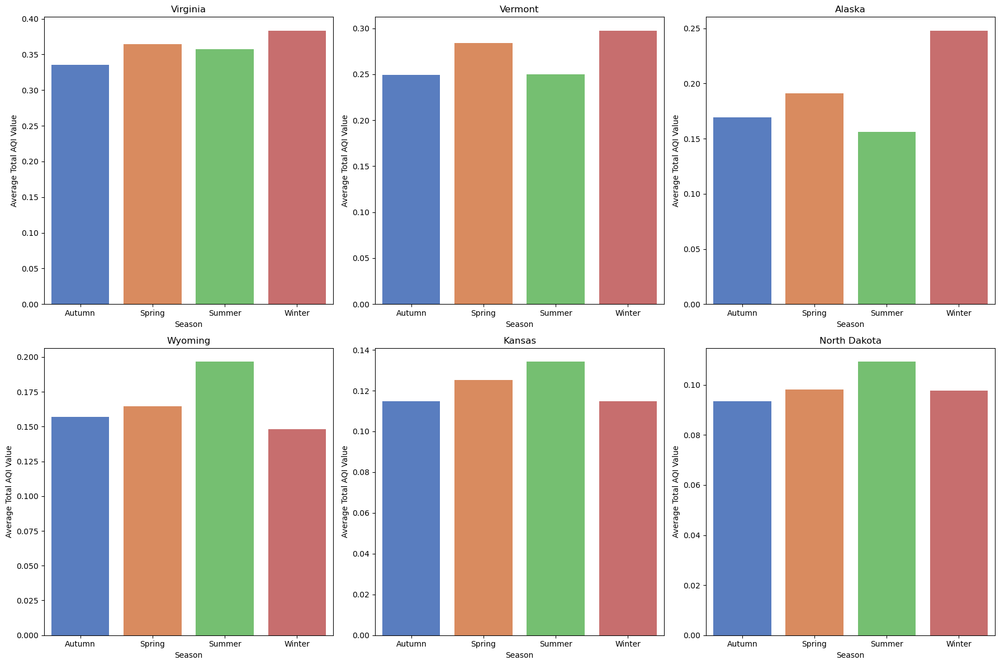

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define function to determine season based on month
def season(month):
    if month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Autumn'
    else:
        return 'Winter'

# Assuming you have the 'Date' column and a 'State' column in your DataFrame
complete_df['Date'] = pd.to_datetime(complete_df['Date'])
complete_df['Season'] = complete_df['Date'].dt.month.map(season)

# Define pollutants
pollutants = ['CO_DAILY_AQI_VALUE', 'NO2_DAILY_AQI_VALUE', 'PM2.5_DAILY_AQI_VALUE', 'SO2_DAILY_AQI_VALUE', 'OZONE_DAILY_AQI_VALUE']

# Calculate the mean of all pollutants for each record
complete_df['Total_AQI'] = complete_df[pollutants].mean(axis=1)

# Calculate the mean AQI value for each state and select the top 10
top_states = complete_df.groupby('STATE')['Total_AQI'].mean().nlargest(6).index.tolist()

# Filter the DataFrame to include only the top 10 states
top_states_df = complete_df[complete_df['STATE'].isin(top_states)]

# Calculate the average total AQI value by state and season
seasonal_state_aqi = top_states_df.groupby(['STATE', 'Season'])['Total_AQI'].mean().reset_index()

# Set up the figure for plotting with an increased figure size
plt.figure(figsize=(18, 12))  # Increased figure size

# Adjust subplot layout to 2 rows by 5 columns for 10 plots
for i, state in enumerate(top_states, 1):
    plt.subplot(2, 3, i)
    state_data = seasonal_state_aqi[seasonal_state_aqi['STATE'] == state]
    sns.barplot(data=state_data, x='Season', y='Total_AQI', palette='muted')
    plt.xlabel('Season')
    plt.ylabel('Average Total AQI Value')
    plt.title(f'{state}')

plt.tight_layout()  # This will make sure there is space between subplots
plt.show()


Colorado
Winter: High AQI levels may be due to temperature inversions, which trap pollutants near the ground, especially in areas like Denver.
Summer: Increased sunlight and higher temperatures can lead to the formation of ground-level ozone, elevating AQI values.

Nevada
Summer: High temperatures contribute to the formation of ozone. Nevada, particularly Las Vegas, experiences heat that can exacerbate air pollution.
Winter: Lower AQI compared to summer, possibly due to less sunlight and cooler temperatures reducing ozone formation.

Utah
Winter: Utah, especially in valleys like those near Salt Lake City, often experiences temperature inversions during winter, leading to high pollution days.
Summer: Increased solar radiation and higher temperatures can lead to higher ozone levels, increasing AQI.

Arizona
Summer: Known for its extremely high temperatures, Arizona's heat can enhance the chemical reactions needed to form ozone, increasing AQI values.
Winter: Cooler and sometimes wetter conditions can help disperse pollutants, lowering AQI.

Missouri
Summer: Humidity and heat in Missouri can contribute to the formation of ground-level ozone.
Winter: Reduced sunlight and industrial and residential heating emissions can affect AQI, although generally lower than in summer.

California
Summer: Wildfires during this season can dramatically increase AQI levels due to smoke, especially in recent years.
Winter: Cooler temperatures and occasional rains help reduce AQI by settling particulate matter and dispersing pollutants.

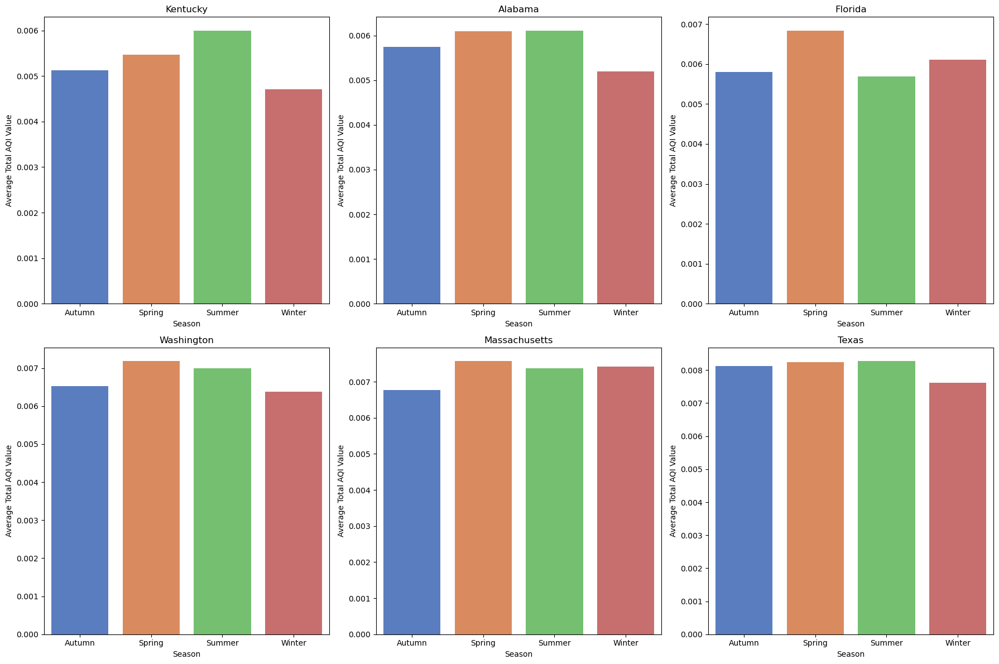

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Define function to determine season based on month
def season(month):
    if month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Autumn'
    else:
        return 'Winter'

# Assuming you have the 'Date' column and a 'State' column in your DataFrame
complete_df['Date'] = pd.to_datetime(complete_df['Date'])
complete_df['Season'] = complete_df['Date'].dt.month.map(season)

# Define pollutants
pollutants = ['CO_DAILY_AQI_VALUE', 'NO2_DAILY_AQI_VALUE', 'PM2.5_DAILY_AQI_VALUE', 'SO2_DAILY_AQI_VALUE', 'OZONE_DAILY_AQI_VALUE']

# Calculate the mean of all pollutants for each record
complete_df['Total_AQI'] = complete_df[pollutants].mean(axis=1)

# Calculate the mean AQI value for each state and select the bottom 6 (states with the highest AQI)
least_states = complete_df.groupby('STATE')['Total_AQI'].mean().nsmallest(6).index.tolist()

# Filter the DataFrame to include only the least 6 states
least_states_df = complete_df[complete_df['STATE'].isin(least_states)]

# Calculate the average total AQI value by state and season
seasonal_state_aqi = least_states_df.groupby(['STATE', 'Season'])['Total_AQI'].mean().reset_index()

# Set up the figure for plotting with an increased figure size
plt.figure(figsize=(18, 12))  # Increased figure size

# Adjust subplot layout to 2 rows by 3 columns for 6 plots
for i, state in enumerate(least_states, 1):
    plt.subplot(2, 3, i)
    state_data = seasonal_state_aqi[seasonal_state_aqi['STATE'] == state]
    sns.barplot(data=state_data, x='Season', y='Total_AQI', palette='muted')
    plt.xlabel('Season')
    plt.ylabel('Average Total AQI Value')
    plt.title(f'{state}')

plt.tight_layout()  # This will make sure there is space between subplots
plt.show()


In [14]:
import plotly.io as pio
pio.renderers.default = "notebook_connected"  # Use "notebook" if offline but with limited functionalities


In [15]:
import pandas as pd
from sklearn.cluster import KMeans
import plotly.express as px

# Select relevant columns for clustering
X_normalized = complete_df[['SITE_LATITUDE', 'SITE_LONGITUDE', 'CO_DAILY_AQI_VALUE', 'NO2_DAILY_AQI_VALUE', 'PM2.5_DAILY_AQI_VALUE', 'SO2_DAILY_AQI_VALUE', 'OZONE_DAILY_AQI_VALUE']]

# Apply K-means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
complete_df['Cluster'] = kmeans.fit_predict(X_normalized)

# Plotting
fig = px.scatter_mapbox(complete_df, lat='SITE_LATITUDE', lon='SITE_LONGITUDE', color='Cluster',
                        hover_name='COUNTY', mapbox_style='open-street-map', title='Geospatial Clustering',
                        zoom=3, center={"lat": complete_df['SITE_LATITUDE'].mean(), "lon": complete_df['SITE_LONGITUDE'].mean()})
fig.show()  # Use fig.show() to make sure it renders


C:\Users\chinm\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



In [16]:
import folium

# Define a list of pollutants
pollutants = ['CO_DAILY_AQI_VALUE', 'NO2_DAILY_AQI_VALUE', 'OZONE_DAILY_AQI_VALUE', 'PM2.5_DAILY_AQI_VALUE', 'SO2_DAILY_AQI_VALUE']

# Iterate over each pollutant
for pollutant in pollutants:
    # Calculate the mean AQI value for each state for the current pollutant
    state_aqi = complete_df.groupby('STATE')[pollutant].mean().reset_index()
    
    # Create a new map for the current pollutant
    m = folium.Map(location=[39.8283, -98.5795], zoom_start=4, title=f'Mean {pollutant}')
    
    # Create a choropleth layer for the current pollutant
    folium.Choropleth(
        geo_data='https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/us-states.json',
        name='Choropleth',
        data=state_aqi,
        columns=['STATE', pollutant],
        key_on='feature.properties.name',
        fill_color='YlOrRd',
        fill_opacity=0.6,
        line_opacity=0.2,
        legend_name=f'Mean {pollutant}'
    ).add_to(m)
    
    # Display the map for the current pollutant
    display(m)
